In [1]:
using FastGaussQuadrature, Plots, DelimitedFiles, Random, Slepians, KernelMatrices
using KrylovKit, IterTools, FFTW
using Dierckx
using DelimitedFiles

Random.seed!(123);

# important functions
include("localization3d.jl")

SL (generic function with 1 method)

In [2]:
fn = homedir()*"/Documents/Crystallography/2022/02_Feb/file" #.txt"

"/Users/chaley/Documents/Crystallography/2022/02_Feb/file"

In [3]:
Nx = Ny = Nz = 961
hNx = hNy = hNz = Int64.((Nx - 1)/2)
sclx = scly = sclz = Nx/2

480.5

In [4]:

thpha = []
chop=60
z = 0:16 # 0:30:961
for i = z
    push!(thpha, (vcat(readdlm(fn*"$i.txt")[1:2:end-chop,:], readdlm(fn*"$i.txt")[1,:]') .- hNx)/sclx)
end

thpha

17-element Vector{Any}:
 [-0.9989594172736732 0.9864724245577523 -0.16857440166493237; -0.9989594172736732 0.9864724245577523 -0.16441207075962538; … ; -0.9989594172736732 0.9219562955254943 -0.21644120707596254; -0.9989594172736732 0.9864724245577523 -0.16857440166493237]
 [-0.9968782518210197 -0.05827263267429761 -0.6285119667013528; -0.9968782518210197 -0.05202913631633715 -0.6285119667013528; … ; -0.9968782518210197 -0.2518210197710718 -0.6014568158168574; -0.9968782518210197 -0.05827263267429761 -0.6285119667013528]
 [-0.9947970863683663 -0.027055150884495317 -0.6305931321540063; -0.9947970863683663 -0.022892819979188347 -0.6285119667013528; … ; -0.9947970863683663 -0.1768990634755463 -0.6160249739854319; -0.9947970863683663 -0.027055150884495317 -0.6305931321540063]
 [-0.9927159209157128 -0.07492195629552549 -0.6305931321540063; -0.9927159209157128 -0.06867845993756504 -0.6305931321540063; … ; -0.9927159209157128 -0.16024973985431842 -0.6201873048907388; -0.9927159209157128 -0.07

┌ Warning: Indices Base.OneTo(1000) of attribute `markersize` does not match data indices 1:1037.
└ @ Plots ~/.julia/packages/Plots/ju9dp/src/utils.jl:141
┌ Warning: Indices Base.OneTo(1000) of attribute `markersize` does not match data indices 1:1037.
└ @ Plots ~/.julia/packages/Plots/ju9dp/src/utils.jl:141


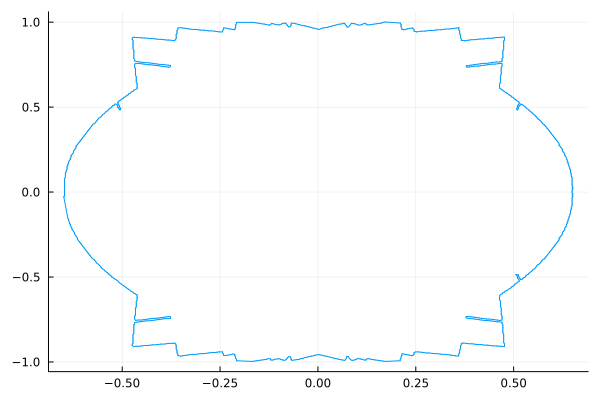

┌ Warning: Indices Base.OneTo(1000) of attribute `markersize` does not match data indices 1:1037.
└ @ Plots ~/.julia/packages/Plots/ju9dp/src/utils.jl:141


In [5]:
i = 16
plot(thpha[i][:,3], thpha[i][:,2], 
    markersize = LinRange(0, 10, (size(thpha[1],1)-15)), label = false)

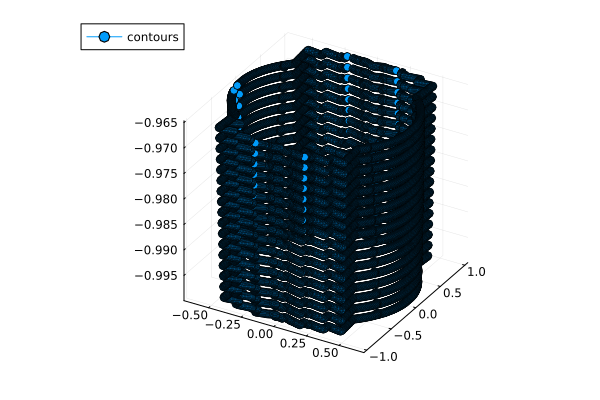

In [6]:
thph = vcat(thpha...)
# This is necessary to close the curve
thph = vcat(thph)

p = plot(thph[:,3], thph[:,2], thph[:,1], label = "contours", marker = :o)

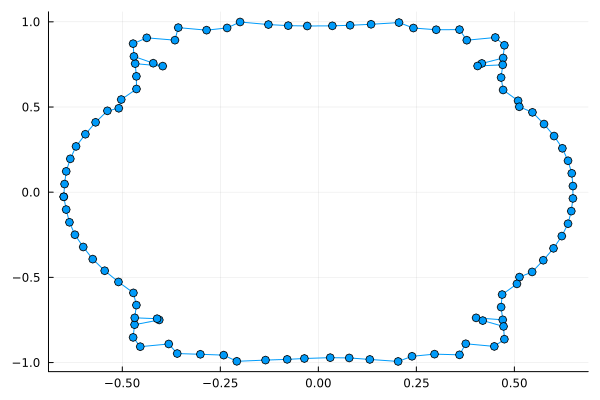

In [7]:
thpha_new = equalNclosedcurve(thpha, 100);

p = plot(thpha_new[i][:,3], thpha_new[i][:,2], #thpha_new[1][:,1], 
    legend = false, #label = "contours", 
    marker = :o)

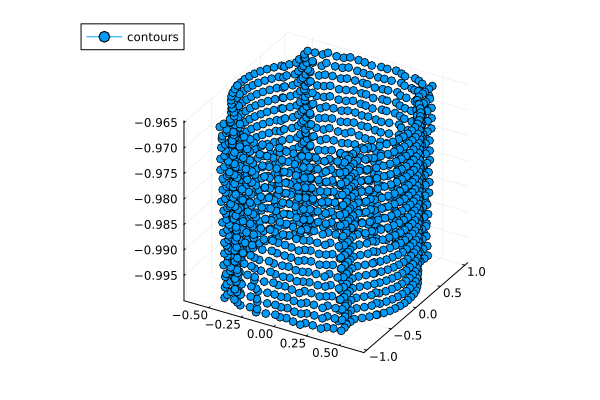

In [8]:
thph = vcat(thpha_new...)
# This is necessary to close the curve
thph = vcat(thph)

p = plot(thph[:,3], thph[:,2], thph[:,1], label = "contours", marker = :o)

In [9]:
Nqx = Nqy = 16
Nqz = 10

# set parameters for the integration

M  = 3
Kp = [4.0]
szs = int = (Nqx, Nqy, Nqz)
prec = 1e-8
exact = false
lvl = 6
maxrank = 256

256

In [10]:
# compute the nodes - first scale in z
colf, th, wqz = scale_quad_nodez(Nqz, (z.-8)./8);
th

10-element Vector{Float64}:
 -0.9739065285171717
 -0.8650633666889845
 -0.6794095682990244
 -0.4333953941292472
 -0.14887433898163122
  0.14887433898163122
  0.4333953941292472
  0.6794095682990244
  0.8650633666889845
  0.9739065285171717

In [11]:
newcurve, pkg = fill2d((z.-8)./8, colf, thpha_new, th, Nqx, Nqy);

In [12]:
# collate nodes weights
no, sqwt, ev = getnodeswts3d(szs, pkg, th, wqz)

([(-0.25692578262215066, -0.8506183673195089, -0.9739065285171717), (-0.2567087690688841, -0.8506183673195089, -0.9739065285171717), (-0.2563265821082139, -0.8506183673195089, -0.9739065285171717), (-0.2557929463780189, -0.8506183673195089, -0.9739065285171717), (-0.25512713782541574, -0.8506183673195089, -0.9739065285171717), (-0.25435321779976516, -0.8506183673195089, -0.9739065285171717), (-0.25349915684328816, -0.8506183673195089, -0.9739065285171717), (-0.25259582252013746, -0.8506183673195089, -0.9739065285171717), (-0.2516758634392308, -0.8506183673195089, -0.9739065285171717), (-0.2507725291160801, -0.8506183673195089, -0.9739065285171717)  …  (0.14745053904078873, 0.9873604597017696, 0.9739065285171717), (0.1540507074163162, 0.9873604597017696, 0.9739065285171717), (0.16077234377726102, 0.9873604597017696, 0.9739065285171717), (0.16737251215278853, 0.9873604597017696, 0.9739065285171717), (0.1736126670669198, 0.9873604597017696, 0.9739065285171717), (0.17926727616078242, 0.987

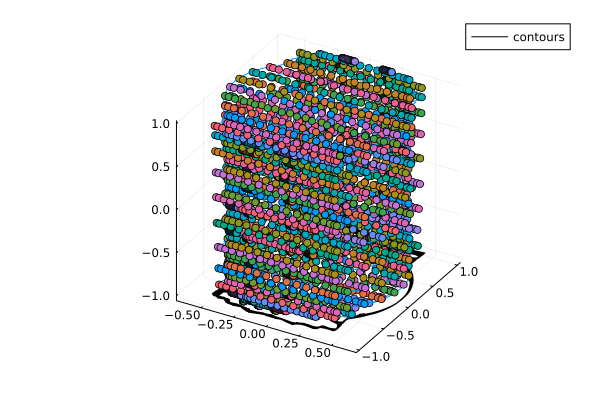

In [13]:
p3 = plot(thph[:,3], thph[:,2], thph[:,1], label = "contours", c = :black);
for i = 1:10
    plot!(p3, newcurve[i][:,3], newcurve[i][:,2], ones(size(newcurve[i][:,2]))*th[i], c = 1, label = "")
    scatter!(p3, pkg[i][1], pkg[i][2], ones(Nqx,Nqy+1)*th[i] , label = "")
end
p3

# Larger example

In [14]:
# include(homedir()*"/Documents/Crystallography/2022/02_Feb/bdy2D.jl")

include("localization3d.jl")

SL (generic function with 1 method)

In [15]:

thpha = []
chop=40
z = 0:30:961
for i = z
    push!(thpha, (vcat(readdlm(fn*"$i.txt")[1:2:end-chop,:], readdlm(fn*"$i.txt")[1,:]') .- hNx)/sclx)# vcat(readdlm(fn*"$i.txt")[1:2:end-chop,:], readdlm(fn*"$i.txt")[1,:]'))
end

thpha

33-element Vector{Any}:
 [-0.9989594172736732 0.9864724245577523 -0.16857440166493237; -0.9989594172736732 0.9864724245577523 -0.16441207075962538; … ; -0.9989594172736732 0.9281997918834547 -0.1768990634755463; -0.9989594172736732 0.9864724245577523 -0.16857440166493237]
 [-0.9365244536940687 1.0010405827263267 -0.037460978147762745; -0.9365244536940687 0.9968782518210197 -0.03537981269510926; … ; -0.9365244536940687 0.9739854318418314 -0.3267429760665973; -0.9365244536940687 1.0010405827263267 -0.037460978147762745]
 [-0.8740894901144641 1.0010405827263267 0.48074921956295524; -0.8740894901144641 0.9947970863683663 0.48074921956295524; … ; -0.8740894901144641 0.9344432882414152 -0.5515088449531738; -0.8740894901144641 1.0010405827263267 0.48074921956295524]
 [-0.8116545265348595 1.0010405827263267 0.5577523413111343; -0.8116545265348595 0.9947970863683663 0.5577523413111343; … ; -0.8116545265348595 0.8844953173777316 -0.6014568158168574; -0.8116545265348595 1.0010405827263267 0.55775

33


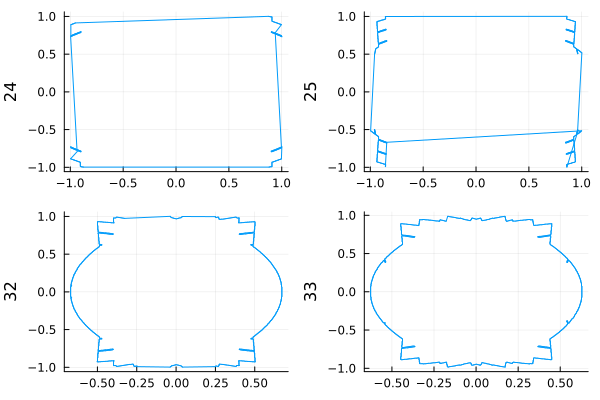

In [16]:
M = length(z)
println(M)
i=[ 24, 25, 32, 33]
p1 = plot(thpha[i[1]][:,3], thpha[i[1]][:,2], ylabel = i[1],
    markersize = LinRange(0, 10, (size(thpha[i[1]],1))), label = false)
p2 = plot(thpha[i[2]][:,3], thpha[i[2]][:,2], ylabel = i[2],
    markersize = LinRange(0, 10, (size(thpha[i[2]],1))), label = false)

p3 = plot(thpha[i[3]][:,3], thpha[i[3]][:,2], ylabel = i[3],
    markersize = LinRange(0, 10, (size(thpha[i[3]],1))), label = false)

p4 = plot(thpha[i[4]][:,3], thpha[i[4]][:,2], ylabel = i[4],
    markersize = LinRange(0, 10, (size(thpha[i[4]],1))), label = false)

plot(p1, p2, p3, p4)

# Cherrypick the good curves

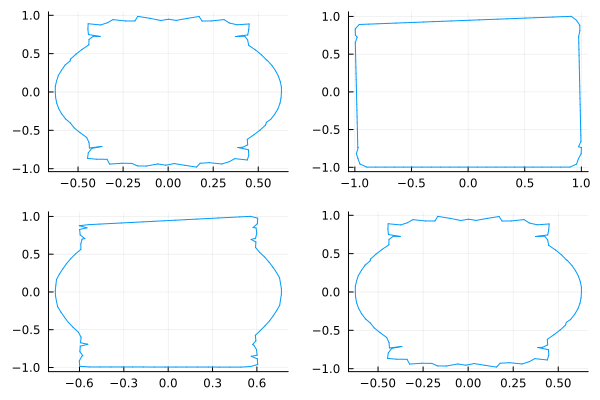

In [17]:
# ind = [1, 2, 4, 8, 9, 10, 11, 23, 24, 25, 26, 30, 32, 33]
ind = [1, 2, 4, 10, 11, 23, 24, 30, 32, 33]
thpha_new = equalNclosedcurve(thpha[ind], 100);

i = [1, 5, 8, 10]
q1 = plot(thpha_new[i[1]][:,3], thpha_new[i[1]][:,2], 
    markersize = LinRange(0, 10, (size(thpha_new[i[1]],1))), label = false)
q2 = plot(thpha_new[i[2]][:,3], thpha_new[i[2]][:,2], 
    markersize = LinRange(0, 10, (size(thpha_new[i[2]],1))), label = false)

q3 = plot(thpha_new[i[3]][:,3], thpha_new[i[3]][:,2], 
    markersize = LinRange(0, 10, (size(thpha_new[i[3]],1))), label = false)

q4 = plot(thpha_new[i[4]][:,3], thpha_new[i[4]][:,2], 
    markersize = LinRange(0, 10, (size(thpha_new[i[4]],1))), label = false)

plot(q1, q2, q3, q4)

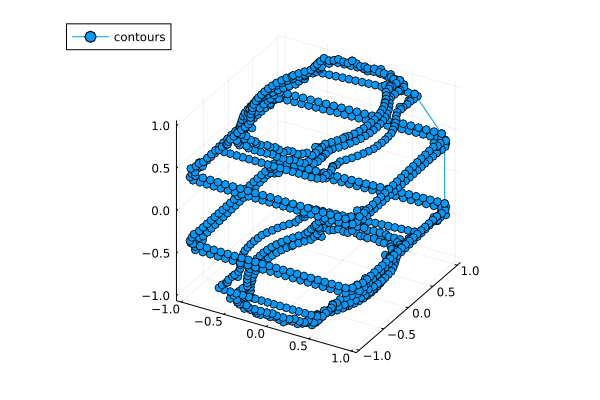

In [18]:
thph = vcat(thpha_new...)
# This is necessary to close the curve
thph = vcat(thph)

p = plot(thph[:,3], thph[:,2], thph[:,1], label = "contours", marker = :o)

In [19]:
(z[ind] .- hNx)/sclx

10-element Vector{Float64}:
 -0.9989594172736732
 -0.9365244536940687
 -0.8116545265348595
 -0.43704474505723206
 -0.37460978147762747
  0.37460978147762747
  0.43704474505723206
  0.8116545265348595
  0.9365244536940687
  0.9989594172736732

In [20]:
# compute the nodes - first scale in z
colf, th, wqz = scale_quad_nodez(Nqz, (z[ind] .- hNx)/sclx);

newcurve, pkg = fill2d((z[ind] .- hNx)/sclx, colf, thpha_new, th, Nqx, Nqy);

# collate nodes weights
no, sqwt, ev = getnodeswts3d(szs, pkg, th, wqz)

([(-0.25248943959708603, -0.9681442630214878, -0.9728930982065399), (-0.251818219485821, -0.9681442630214878, -0.9728930982065399), (-0.25063612016343406, -0.9681442630214878, -0.9728930982065399), (-0.2489855917572355, -0.9681442630214878, -0.9728930982065399), (-0.2469262545221519, -0.9681442630214878, -0.9728930982065399), (-0.24453252990031019, -0.9681442630214878, -0.9728930982065399), (-0.24189093041675347, -0.9681442630214878, -0.9728930982065399), (-0.2390969290478615, -0.9681442630214878, -0.9728930982065399), (-0.23625150751841864, -0.9681442630214878, -0.9728930982065399), (-0.23345750614952668, -0.9681442630214878, -0.9728930982065399)  …  (-0.11147464800851208, 0.9821084188049773, 0.9728930982065399), (-0.1080436152644236, 0.9821084188049773, 0.9728930982065399), (-0.10454943858042134, 0.9821084188049773, 0.9728930982065399), (-0.10111840583633287, 0.9821084188049773, 0.9728930982065399), (-0.09787452255633129, 0.9821084188049773, 0.9728930982065399), (-0.09493502952339597

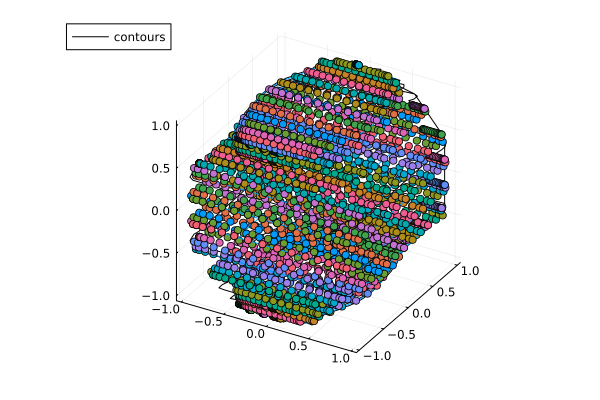

In [21]:
p3 = plot(thph[:,3], thph[:,2], thph[:,1], label = "contours", c = :black);
for i = 1:10
    plot!(p3, newcurve[i][:,3], newcurve[i][:,2], ones(size(newcurve[i][:,2]))*th[i], c = 1, label = "")
    scatter!(p3, pkg[i][1], pkg[i][2], ones(Nqx,Nqy+1)*th[i] , label = "")
end
p3

In [22]:
maxrank = 256
s, sl = slepian3(szs, (z[ind] .- hNx)/sclx, thpha; 
                M = 3, Kp = [4.0], prec = 1e-8, exact = false, lvl = 6, 
                    maxrank = 256, int = nothing)

LoadError: UndefVarError: `customsleps_ext` not defined

In [23]:
p1 = Array{Plots.Plot{Plots.GRBackend},1}(undef, length(sl))
p2 = Array{Plots.Plot{Plots.GRBackend},1}(undef, length(sl))
ssl = SL(sl)
ran = 1:3
for i = ran
    p1[i] = heatmap(real.(sl[i]),
        c = :RdBu, clims = (-1.25, 1.25), ylabel = i) # this transpose is important
    #plot!(p1[i], x[1], y[1], legend = false, c = :black)

    # ssl = abs2.(fftshift(fft(sl[i])))
    p2[i] = heatmap(log10.(ssl[i]), ylabel = i)
end

psimple = plot(thph[:,3], thph[:,2], thph[:,1], label = "contours", c = :black);
plot(p1[1:3]..., psimple)

LoadError: UndefVarError: `sl` not defined

In [24]:
length(z)

33

In [25]:
whichz = 10
p3 = Array{Plots.Plot{Plots.GRBackend},1}(undef, whichz)
for i = 1:whichz
    p3[i] = heatmap(LinRange(-1,1,16), LinRange(-1,1,16), Float64.(sl[2][:,:,i]), c = :RdBu, colorbar = false)
end
# plot!(thpha[16][:,3], thpha[16][:,2], label = false)
plot(p3...)

LoadError: UndefVarError: `sl` not defined

In [26]:
plot(heatmap(Float64.(sl[1][:,:,5]), c = :RdBu), # clims = 0.007*[-1., 1], 
     heatmap(log10.(ssl[1][:,:,5])))

LoadError: UndefVarError: `sl` not defined

In [27]:
plot(p2[1:3]...)

LoadError: MethodError: no method matching getindex(::Plots.Plot{Plots.GRBackend}, ::UnitRange{Int64})

[0mClosest candidates are:
[0m  getindex(::Plots.Plot, [91m::Union{Integer, Vector{<:Integer}}[39m)
[0m[90m   @[39m [36mPlots[39m [90m~/.julia/packages/Plots/ju9dp/src/[39m[90m[4mtypes.jl:138[24m[39m
[0m  getindex(::Plots.Plot, [91m::Integer[39m, [91m::Integer[39m)
[0m[90m   @[39m [36mPlots[39m [90m~/.julia/packages/Plots/ju9dp/src/[39m[90m[4mtypes.jl:142[24m[39m
[0m  getindex(::Plots.Plot, [91m::Symbol[39m)
[0m[90m   @[39m [36mPlots[39m [90m~/.julia/packages/Plots/ju9dp/src/[39m[90m[4margs.jl:1744[24m[39m
